In [8]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse.linalg import svds

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [9]:
# user_perfume_data = pd.merge(rating_data, perfume_data, on='perfumeId')
user_perfume_data = pd.read_csv("./user_review_jiho.csv")
user_perfume_data.head()

,userId,name,brand,rating
0,0,lime basil & mandarin,jomalone,5.0
1,0,warm cotton,clean,4.0
2,0,blackberry & bay,jomalone,4.0
3,0,gypsy water,byredo,5.0
4,0,mojave ghost,byredo,2.0


In [10]:
user_perfume_data.shape


(445, 4)

In [11]:
user_perfume_data["title"] = user_perfume_data["name"] + " " +user_perfume_data["brand"]

In [12]:
user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='title').fillna(0)


In [13]:
user_perfume_rating.shape

(39, 255)

In [14]:
user_perfume_rating.head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white shirts loe,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt jomalone,레이디 고디바 향기의미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
userId,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0


In [15]:
perfume_user_rating = user_perfume_rating.values.T
perfume_user_rating.shape

(255, 39)

In [16]:
type(perfume_user_rating)

numpy.ndarray

In [17]:
SVD = TruncatedSVD(n_components=12)
matrix = SVD.fit_transform(perfume_user_rating)
matrix.shape

(255, 12)

In [18]:
matrix[0]

array([ 0.22256774,  0.95620756,  0.82527554,  0.25380068,  0.94371386,
        2.03664919, -1.23476329,  0.38392402,  0.38327151, -0.18409726,
       -0.23798587,  0.19693606])

In [19]:
corr = np.corrcoef(matrix)
corr.shape

(255, 255)

In [20]:
corr2 = corr[:200, :200]
corr2.shape

(200, 200)

<AxesSubplot:>

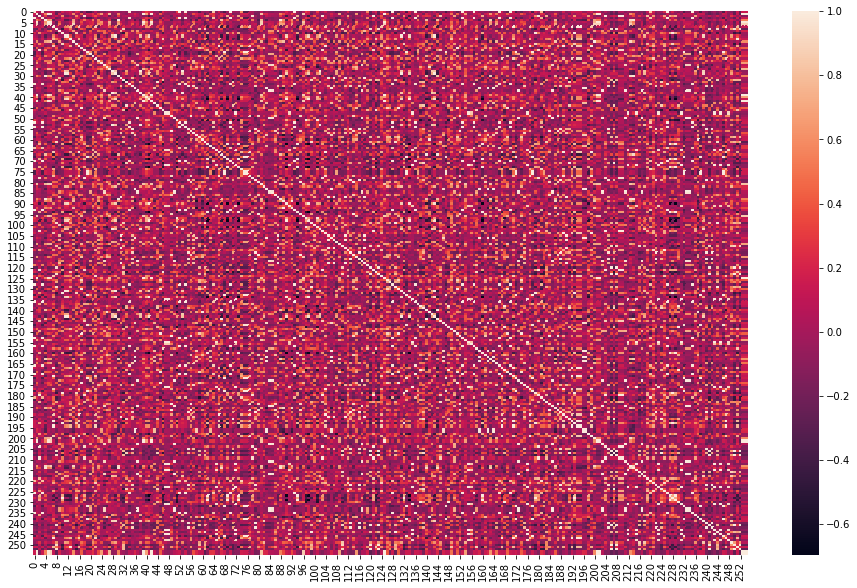

In [21]:
plt.figure(figsize=(16, 10))
sns.heatmap(corr)

In [22]:
perfume_title = user_perfume_rating.columns
perfume_title_list = list(perfume_title)
coffey_hands = perfume_title_list.index("eau triple lichen d'ecosse buly 1803")

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'lime basil & mandarin jomalone',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal',
 'tam dao eau de toilette diptyque']

In [23]:
corr_coffey_hands = corr[coffey_hands]
list(perfume_title[(corr_coffey_hands >= 0.9)])

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal']

In [24]:
df_user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='title').fillna(0)

In [25]:
df_user_perfume_rating.head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white shirts loe,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt jomalone,레이디 고디바 향기의미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
userId,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0


In [26]:
matrix = df_user_perfume_rating.values

user_ratings_mean = np.mean(matrix, axis =1)

matrix_user_mean =matrix-user_ratings_mean.reshape(-1,1)

In [27]:
matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [28]:
matrix.shape

(39, 255)

In [29]:
user_ratings_mean.shape

(39,)

In [30]:
pd.DataFrame(matrix_user_mean, columns=df_user_perfume_rating.columns).head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white shirts loe,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt jomalone,레이디 고디바 향기의미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
0,-0.109804,-0.109804,-0.109804,-0.109804,-0.109804,-0.109804,-0.109804,-0.109804,-0.109804,-0.109804,...,-0.109804,-0.109804,-0.109804,-0.109804,4.890196,-0.109804,-0.109804,-0.109804,-0.109804,-0.109804
1,-0.156863,-0.156863,-0.156863,-0.156863,2.843137,-0.156863,-0.156863,-0.156863,-0.156863,-0.156863,...,-0.156863,-0.156863,-0.156863,-0.156863,-0.156863,-0.156863,-0.156863,-0.156863,-0.156863,-0.156863
2,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,...,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961,-0.101961
3,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,...,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,-0.176471,2.823529,-0.176471,-0.176471,-0.176471
4,-0.211765,-0.211765,-0.211765,-0.211765,-0.211765,-0.211765,-0.211765,-0.211765,-0.211765,-0.211765,...,-0.211765,-0.211765,-0.211765,-0.211765,3.788235,-0.211765,-0.211765,-0.211765,-0.211765,-0.211765


In [31]:
U, sigma, Vt = svds(matrix_user_mean, k=12)

In [32]:
print(U.shape)
print(sigma.shape)
print(Vt.shape)

(39, 12)
(12,)
(12, 255)


In [33]:
sigma = np.diag(sigma)

In [34]:
sigma.shape

(12, 12)

In [35]:
svd_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) + user_ratings_mean.reshape(-1, 1)

In [36]:
df_svd_preds = pd.DataFrame(svd_user_predicted_ratings, columns = df_user_perfume_rating.columns)
# df_svd_preds.iloc[36]

In [50]:
def recommend_perfumes(df_svd_preds, user_perfume_data, user_id, num_recommendations=10):
    user_row_number = user_id
    sorted_user_predictions = df_svd_preds.iloc[user_row_number].sort_values(ascending=False)
    user_history = user_perfume_data[user_perfume_data.userId == user_id].sort_values(['rating'], ascending=False)
    recommendations = user_perfume_data[~user_perfume_data['title'].isin(user_history['title'])]
    recommendations = recommendations.merge( pd.DataFrame(sorted_user_predictions).reset_index(), on = 'title')
    recommendations = recommendations.rename(columns = {user_row_number: 'Predictions'}).sort_values('Predictions', ascending = False)
    recommendations.reset_index(inplace=True)
    recommendations.drop(["userId", "rating", "index"], axis=1,inplace=True)
    recommendations.drop_duplicates(inplace=True)
    recommendations = recommendations.iloc[:num_recommendations, :]
    return user_history, recommendations

In [38]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 36, 10)

In [39]:
already_rated.head(10)

,userId,name,brand,rating,title
429,36,tacit,aesop,5.0,tacit aesop
431,36,touch for men,burberry,5.0,touch for men burberry
432,36,dirty,lush,5.0,dirty lush
434,36,tam dao eau de toilette,diptyque,5.0,tam dao eau de toilette diptyque
428,36,jazz club,maison margiela,3.0,jazz club maison margiela
430,36,hwyl,aesop,3.0,hwyl aesop
433,36,blanche,byredo,2.0,blanche byredo


In [40]:
predictions

,name,brand,title,Predictions
0,jasmin 17,le labo,jasmin 17 le labo,0.885396
2,pansy,lush,pansy lush,0.880588
5,lime basil & mandarin,jomalone,lime basil & mandarin jomalone,0.858963
8,l'ombre dans l'eau eau de toilette,diptyque,l'ombre dans l'eau eau de toilette diptyque,0.849856
12,rose of no man's land,byredo,rose of no man's land byredo,0.818989
13,geranium odorata eau de toilette,diptyque,geranium odorata eau de toilette diptyque,0.818989
14,a la rose,maison francis kurkdjian,a la rose maison francis kurkdjian,0.814512
16,english pear & fressia,jomalone,english pear & fressia jomalone,0.804799
25,eau triple lichen d'ecosse,buly 1803,eau triple lichen d'ecosse buly 1803,0.780438
27,vetyverio eau de toilette,diptyque,vetyverio eau de toilette diptyque,0.669437


In [41]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 37, 10)

In [42]:
already_rated.head(10)

,userId,name,brand,rating,title
437,37,english pear & fressia,jomalone,5.0,english pear & fressia jomalone
435,37,miss dior blooming bouquet,christian dior,4.0,miss dior blooming bouquet christian dior
436,37,tam dao eau de toilette,diptyque,4.0,tam dao eau de toilette diptyque
438,37,blackberry & bay,jomalone,2.0,blackberry & bay jomalone


In [43]:
predictions


,name,brand,title,Predictions
0,incanto charms,salvatore ferragamo,incanto charms salvatore ferragamo,1.091921
5,blanche,byredo,blanche byredo,1.057966
14,eau rose eau de toilette,diptyque,eau rose eau de toilette diptyque,0.794754
16,wild bluebell,jomalone,wild bluebell jomalone,0.745416
18,jeanne lanvin,lanvin,jeanne lanvin lanvin,0.708436
22,marry me,lanvin,marry me lanvin,0.600976
26,replica flower market,maison margiela,replica flower market maison margiela,0.481145
27,bombshell,dani mackenzie,bombshell dani mackenzie,0.460896
29,le jardin de monsieur li,hermès,le jardin de monsieur li hermès,0.447168
31,eau des sens eau de toilette,diptyque,eau des sens eau de toilette diptyque,0.431679


In [51]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 38, 10)

In [52]:
already_rated.head(10)

,userId,name,brand,rating,title
440,38,ck one,calvin klein,5.0,ck one calvin klein
439,38,blanche,byredo,4.0,blanche byredo
442,38,warm cotton,clean,4.0,warm cotton clean
444,38,tam dao eau de toilette,diptyque,4.0,tam dao eau de toilette diptyque
441,38,jazz club,maison margiela,3.0,jazz club maison margiela
443,38,ferrari light essence,ferrari,3.0,ferrari light essence ferrari


In [53]:
predictions

,name,brand,title,Predictions
0,artisan,john varvatos,artisan john varvatos,1.403464
4,wood sage & sea salt,jomalone,wood sage & sea salt jomalone,1.258831
14,eclat d'arpege pour homme,lanvin,eclat d'arpege pour homme lanvin,1.019752
20,light blue,dolce&gabbana,light blue dolce&gabbana,0.898988
23,vetyverio eau de toilette,diptyque,vetyverio eau de toilette diptyque,0.663343
25,english pear & fressia,jomalone,english pear & fressia jomalone,0.654134
34,eau des sens eau de toilette,diptyque,eau des sens eau de toilette diptyque,0.652816
38,blue glow by jlo,jennifer lopez,blue glow by jlo jennifer lopez,0.652663
45,lucky wish,anna sui,lucky wish anna sui,0.640862
47,tacit,aesop,tacit aesop,0.552921


# User 38
## CK One
### Top Notes
Lemon, Green, Bergamot, Pineapple, Mandarin Orange, Cardamom, Papaya

### Middle Notes
Lily-of-the-Valley, Jasmine, Violet, Nutmeg, Rose, Orris Root, Freesia

### Base Notes
Green, Musk, Cedar, Sandalwood, Oakmoss, Amber, Green Tea


## Blanche Byredo
### Top Notes
Aldehydes, Rose, Pink Pepper

### Middle Notes
Peony Violet African Orange Flower

### Base Notes
Musk, Woody Notes, Sandalwood


## Tam Dao
### Top Notes
Italian Cypress, Myrtle, Rose

### Middle Notes
Sandalwood Cedar

### Base Notes 
Brazilian Rosewood, Spices, Amber, White Musk



## Artisan John Varvatos
### Top
Clementine, Tangerine, Marjoram, Thyme
### Middle
Orange Blossom, Ginger, Lavender, Jasmine
### Base Notes
Musk, Woodsy Notes, Amber



In [60]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 3, 10)
print(already_rated.head(10))
predictions

    userId                       name                brand  rating  \
25       3                    blanche               byredo     5.0   
26       3                      pansy                 lush     5.0   
31       3                  melograno  santa maria novella     5.0   
24       3                 lucky wish             anna sui     4.0   
32       3                    b scent                 lush     4.0   
33       3     english pear & fressia             jomalone     4.0   
35       3                    j'adore       christian dior     4.0   
27       3                    artisan        john varvatos     3.0   
28       3  chanel no 5 eau de parfum               chanel     3.0   
29       3  eclat d'arpege pour homme               lanvin     3.0   

                               title  
25                    blanche byredo  
26                        pansy lush  
31     melograno santa maria novella  
24               lucky wish anna sui  
32                      b scent lu

,name,brand,title,Predictions
0,tam dao eau de toilette,diptyque,tam dao eau de toilette diptyque,1.957380
6,wood sage & sea salt,jomalone,wood sage & sea salt jomalone,1.487568
16,ck one,calvin klein,ck one calvin klein,1.366558
20,eau rose eau de toilette,diptyque,eau rose eau de toilette diptyque,1.360731
22,burberry brit sheer,burberry,burberry brit sheer burberry,1.094297
25,eau des sens eau de toilette,diptyque,eau des sens eau de toilette diptyque,1.084989
29,replica flower market,maison margiela,replica flower market maison margiela,1.015931
30,american cream,lush,american cream lush,0.889776
32,dirty,lush,dirty lush,0.856029
35,ophelia,james heeley,ophelia james heeley,0.817600
